# Predicción de costos de Uber

En este proyecto se emplean algoritmos de ML buscando mejorar sus hiperparámetros con fin de predecir costos de Uber

## Análisis de datos

In [ ]:
# importamos librerias

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls "/content/drive/MyDrive/CD_16_1_PrediccionCostosUber"

datos  precios_uber.ipynb


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/CD_16_1_PrediccionCostosUber/datos/uber_train_validation.csv")


### Análisis exploratorio de datos

In [ ]:
df.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,pickup_year,pickup_month,pickup_weekday,pickup_hour,geo_distance
count,158000.000000,158000.000000,158000.000000,158000.000000,158000.000000,158000.000000,158000.000000,158000.000000,158000.000000,158000.000000,158000.000000
mean,11.329309,-73.910131,40.687741,-73.909246,40.687950,1.690595,2011.746854,6.281000,3.050816,13.492854,3.396730
std,9.511901,2.700447,2.650642,2.700566,2.650906,1.305403,1.863625,3.444175,1.945089,6.507205,4.024804
min,2.500000,-75.426904,-74.015515,-75.458979,-74.009857,1.000000,2009.000000,1.000000,0.000000,0.000000,0.050318
25%,6.000000,-73.992240,40.736525,-73.991610,40.735332,1.000000,2010.000000,3.000000,1.000000,9.000000,1.290341
50%,8.500000,-73.982139,40.753317,-73.980580,40.753738,1.000000,2012.000000,6.000000,3.000000,14.000000,2.188168
75%,12.500000,-73.968504,40.767605,-73.965662,40.768332,2.000000,2013.000000,9.000000,5.000000,19.000000,3.959056
max,190.830000,40.808425,42.478467,40.831932,42.464187,6.000000,2015.000000,12.000000,6.000000,23.000000,177.995655


In [ ]:
df.shape

(158000, 14)

In [ ]:
df.dtypes

,0
fare_amount,float64
pickup_datetime,object
pickup_longitude,float64
pickup_latitude,float64
dropoff_longitude,float64
dropoff_latitude,float64
passenger_count,int64
pickup_year,int64
pickup_month,int64
pickup_weekday,int64


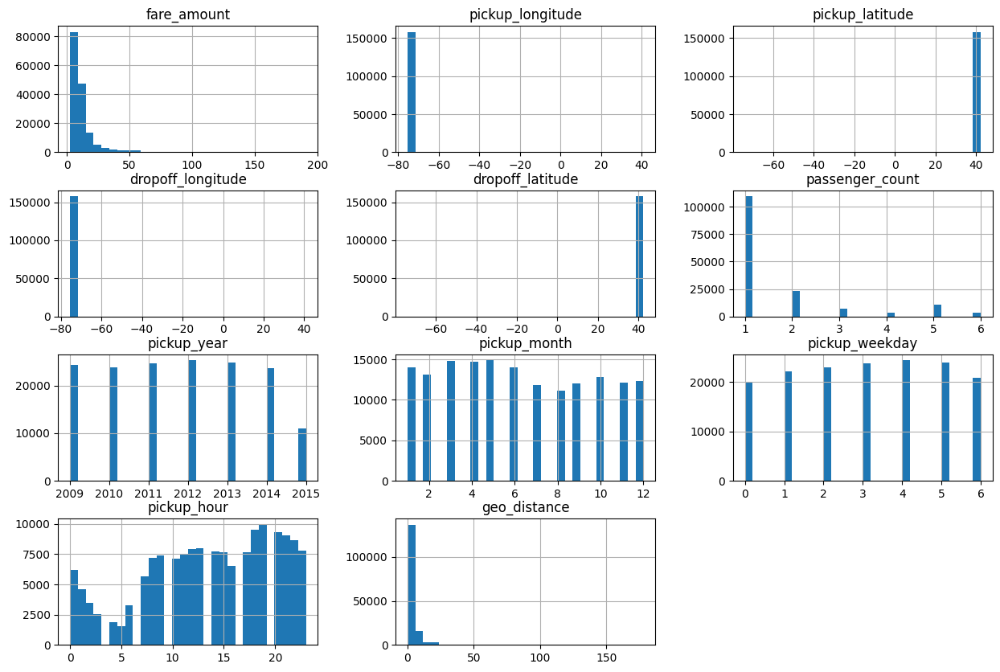

In [ ]:
df.hist(bins=30, figsize=(15,10))
plt.show()

In [ ]:
#creamos un mapa para visualizar los puntos de recogida y entrega de los viajes de Uber
lat_mean = df[['pickup_latitude', 'dropoff_latitude']].mean().mean()
lon_mean = df[['pickup_longitude', 'dropoff_longitude']].mean().mean()

pick_ups = df[['pickup_latitude', 'pickup_longitude']].to_numpy()
drop_offs = df[['dropoff_latitude', 'dropoff_longitude']].to_numpy()

In [ ]:
import folium
m = folium.Map(location=[lat_mean, lon_mean], zoom_start=12)
m;

In [ ]:
from folium import plugins
from folium.plugins import HeatMap

HeatMap(pick_ups, radius = 15, min_opacity=0.4).add_to(m)
m


In [ ]:
HeatMap(drop_offs, radius = 15, min_opacity=0.4).add_to(m)
m


### Correlación de variables

In [ ]:
df.columns

Index(['fare_amount', 'pickup_datetime', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'passenger_count',
       'pickup_year', 'pickup_month', 'pickup_weekday', 'pickup_hour',
       'pickup_season', 'pickup_period', 'geo_distance'],
      dtype='object')

In [ ]:
#atributos simples del dataset

atributo_simple = ['pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'passenger_count',
       'pickup_year', 'pickup_month', 'pickup_weekday', 'pickup_hour', 'geo_distance']

Text(0.5, 1.0, 'Matriz de Correlación de Atributos')

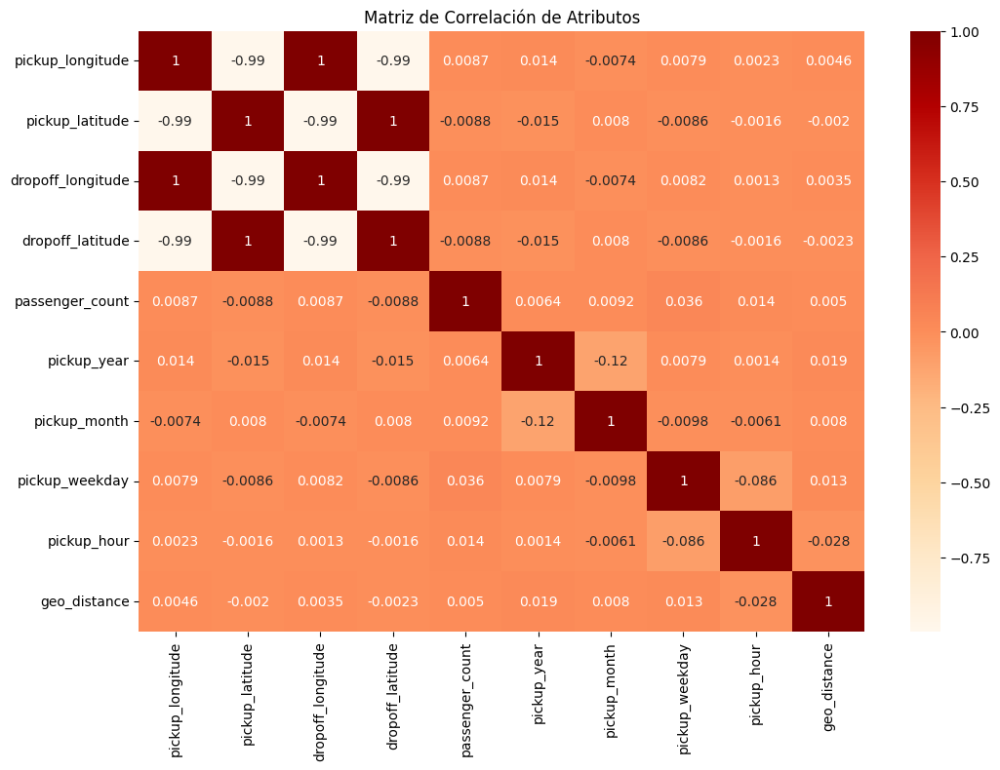

In [ ]:
#matriz de correlación

correlation_matrix = df[atributo_simple].corr()
plt.figure(figsize=(12,8))
sns.heatmap(correlation_matrix, annot=True, cmap='OrRd')
plt.title('Matriz de Correlación de Atributos')

#### Distancias y puntos importantes
Como se vió en el mapa de folium, existen punto de interés como aeropuertos. Nueva York cuenta con tres aeropuertos, siendo el más concurrido el aeropuerto internacion John F. Kennedy (JFK), seguido del aeropuerto LaGuardia (LGA), por último el aeropuerto internacional Newark Liberty (EWR). Para nuestro modelo es relevante conocer esto ya que los desplazamientos que realizan los servicios de Uber hacia los aeropuertos en la mayoria de ocasiones son viajes largos y/o que incluyen peajes, encareciendo así las tarifas del servicio.

Asimismo, es importante considerar las horas a las que se toman los viajes y las distancias de ellos. Estás son variables separadas en el dataset, pero podemos establecer una relación entre ambas variables mediante una multiplicación de ambas columnas. Recordemos que no es lo mismo tomar un viaje de 5km a las 3am que tomar uno de 2km a las 7am.


In [ ]:
#Coordenadas de aeropuertos en NYC

JFK = (40.64469971103775, -73.77978304127289)
LGA = (40.77725104571025, -73.87421571488265)
EWR = (40.68950985860369, -74.17681325966153)

In [ ]:
# Distancia Haversine en km
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371.0  # radio de la Tierra en km

    lat1 = np.radians(lat1)
    lon1 = np.radians(lon1)
    lat2 = np.radians(lat2)
    lon2 = np.radians(lon2)

    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = np.sin(dlat/2.0)**2 + np.cos(lat1)*np.cos(lat2)*np.sin(dlon/2.0)**2
    c = 2 * np.arcsin(np.sqrt(a))
    return R * c

In [ ]:
# Pickup a aeropuertos
df['dist_pickup_JFK'] = haversine_distance(
    df['pickup_latitude'], df['pickup_longitude'],
    JFK[0], JFK[1]
)

df['dist_pickup_LGA'] = haversine_distance(
    df['pickup_latitude'], df['pickup_longitude'],
    LGA[0], LGA[1]
)

df['dist_pickup_EWR'] = haversine_distance(
    df['pickup_latitude'], df['pickup_longitude'],
    EWR[0], EWR[1]
)

atributo_simple.append('dist_pickup_JFK')
atributo_simple.append('dist_pickup_LGA')
atributo_simple.append('dist_pickup_EWR')

In [ ]:
# Dropoff a aeropuertos
df['dist_dropoff_JFK'] = haversine_distance(
    df['dropoff_latitude'], df['dropoff_longitude'],
    JFK[0], JFK[1]
)

df['dist_dropoff_LGA'] = haversine_distance(
    df['dropoff_latitude'], df['dropoff_longitude'],
    LGA[0], LGA[1]
)

df['dist_dropoff_EWR'] = haversine_distance(
    df['dropoff_latitude'], df['dropoff_longitude'],
    EWR[0], EWR[1]
)

atributo_simple.append('dist_dropoff_JFK')
atributo_simple.append('dist_dropoff_LGA')
atributo_simple.append('dist_dropoff_EWR')

In [ ]:
df['manhattan_distance'] = (
    (df['dropoff_longitude'] - df['pickup_longitude']).abs() +
    (df['dropoff_latitude']  - df['pickup_latitude']).abs()
)

atributo_simple.append('manhattan_distance')

In [ ]:
#determinamos si un viaje inició o finalizó en un aeropuerto

threshold_km = 2.0

df['is_airport_trip'] = (
    (df[['dist_pickup_JFK', 'dist_pickup_LGA', 'dist_pickup_EWR']].min(axis=1) < threshold_km) |
    (df[['dist_dropoff_JFK', 'dist_dropoff_LGA', 'dist_dropoff_EWR']].min(axis=1) < threshold_km)
).astype(int)


In [ ]:
# interacción entre distancia y hora del día

df['distance_hour_interaction'] = df['geo_distance'] * df['pickup_hour']

atributo_simple.append('distance_hour_interaction')

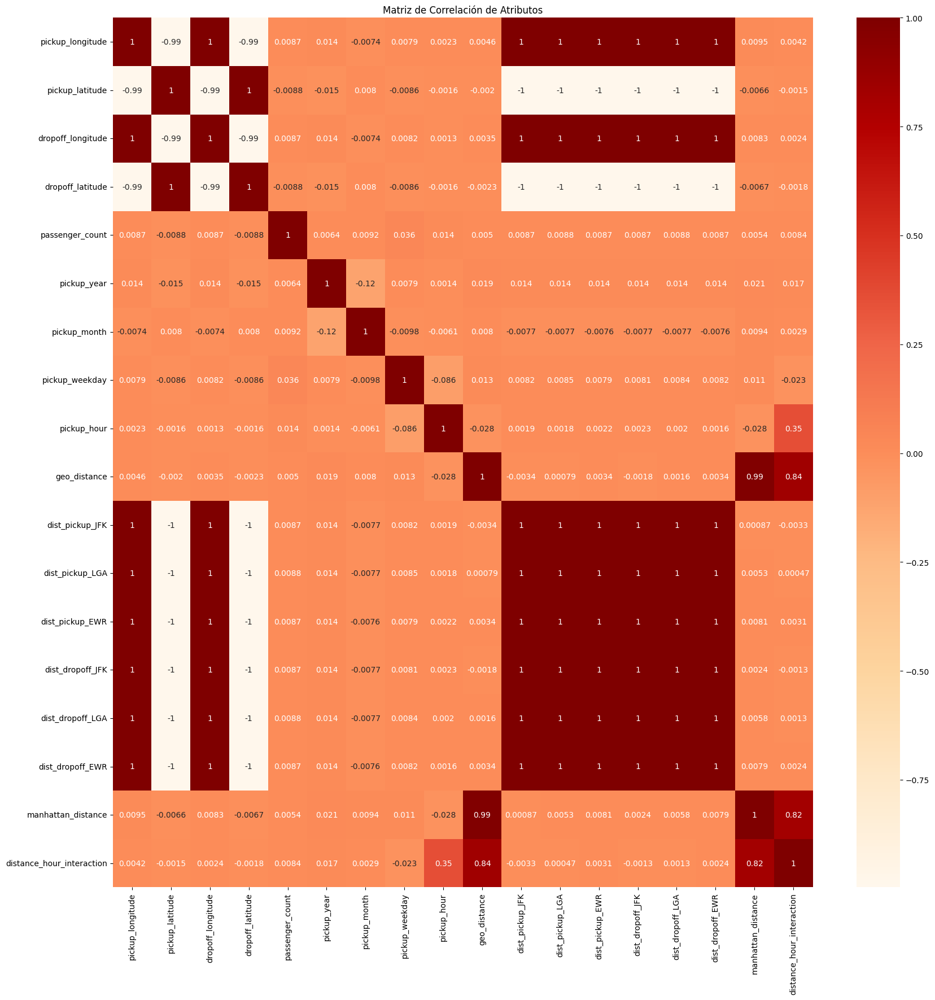

In [ ]:
correlation_matrix = df[atributo_simple].corr()
plt.figure(figsize=(20,20))
sns.heatmap(correlation_matrix, annot=True, cmap='OrRd')
plt.title('Matriz de Correlación de Atributos')
plt.show()

### Preparamos los datos y sus transformaciones

In [ ]:
#Revisamos si hay valores nulos en el DataFrame
any(df.isnull())

True

In [ ]:
#númer
len(df)

158000

In [ ]:
#Borramos datos nulos
df.dropna(inplace=True)

In [ ]:
len(df)

158000

### ColumnTransformer y pipeline

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

In [ ]:
#creamos nuestra lista de variables númerica y categóricas

list_cat = ['pickup_season', 'pickup_period', 'is_airport_trip'] #tratamos is_airport_trip como categórica

list_num = ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'passenger_count',
 'pickup_year', 'pickup_month', 'pickup_weekday', 'pickup_hour', 'geo_distance', 'dist_pickup_JFK',
 'dist_pickup_LGA', 'dist_pickup_EWR', 'dist_dropoff_JFK', 'dist_dropoff_LGA', 'dist_dropoff_EWR',
 'distance_hour_interaction', 'manhattan_distance']

In [ ]:
# creamos el pipeline de preprocesamiento para datos numéricos y categóricos.

transformacion_num = Pipeline([('scaler', StandardScaler())])
transformacion_cat = Pipeline([('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))])

In [ ]:
# definimo los transformadores

transformacion = ColumnTransformer([('num', transformacion_num, list_num),
                                    ('cat', transformacion_cat, list_cat)])


### Preparamos las muestras de entrenamiento y prueba

In [ ]:
X = df.drop(['fare_amount', 'pickup_datetime'], axis=1)
X.head(2)


,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,pickup_year,pickup_month,pickup_weekday,pickup_hour,pickup_season,...,geo_distance,dist_pickup_JFK,dist_pickup_LGA,dist_pickup_EWR,dist_dropoff_JFK,dist_dropoff_LGA,dist_dropoff_EWR,manhattan_distance,is_airport_trip,distance_hour_interaction
0,-73.997719,40.741156,-73.976336,40.740022,1,2010,1,1,12,Winter,...,1.805911,21.275396,11.149603,16.149836,19.671273,9.545578,17.805701,0.022517,0,21.670928
1,-74.010218,40.711418,-74.004135,40.725397,1,2011,2,5,12,Winter,...,1.636753,20.800207,13.596321,14.253711,20.937520,12.369855,15.092368,0.020062,0,19.641037


In [ ]:
y =df['fare_amount']
y.head(2)

,fare_amount
0,8.1
1,4.9


In [ ]:
# dividimos los datos para entrenamiento y prueba
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42 )

In [ ]:
# revisamos  el tamaño de cada muestra
print(len(X) , len(X) *0.8 , len(X) *0.2)

print(len(X_train))
print(len(X_test))
print(len(y_test))
print(len(y_train))

158000 126400.0 31600.0
126400
31600
31600
126400


### Fine tune del modelo RF

In [ ]:
from sklearn.ensemble  import RandomForestRegressor

RF_regression = RandomForestRegressor()

In [ ]:
RF_regression.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [ ]:
#definimos el pipeline completo: modelo + transformacion

modelo_RF = Pipeline([('transformer', transformacion),
                      ('RF_regression', RF_regression)])

modelo_RF

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['pickup_longitude',
                                                   'pickup_latitude',
                                                   'dropoff_longitude',
                                                   'dropoff_latitude',
                                                   'passenger_count',
                                                   'pickup_year',
                                                   'pickup_month',
                                                   'pickup_weekday',
                                                   'pickup_hour',
                                                   'geo_distance',
                                                   'dist_pickup_JFK',
                                                   'dist_pickup_LGA',
                                                   'dist_pickup_EWR',
                                                   'dist_dropoff_JFK',
                                                   'dist_dropoff_LGA',
                                                   'dist_dropoff_EWR',
                                                   'distance_hour_interaction',
                                                   'manhattan_distance']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['pickup_season',
                                                   'pickup_period',
                                                   'is_airport_trip'])])),
                ('RF_regression', RandomForestRegressor())])

In [ ]:
# Utilizamos la función GridSearchCV para encontrar los valores optimos
from sklearn.model_selection import GridSearchCV

In [ ]:
#parametros a evaluar
n_estimators=[200, 300]
min_samples_split=[2, 15]
max_depth=[20, 35]
max_features = ['sqrt']
parametros = {
    'RF_regression__n_estimators': n_estimators,
    'RF_regression__min_samples_split': min_samples_split,
    'RF_regression__max_depth':max_depth,
    'RF_regression__max_features': max_features
}

In [ ]:
import gc
gc.collect()

235

In [ ]:
#Definicion del grid de busqueda
grid_RF = GridSearchCV(modelo_RF, param_grid=parametros, cv=3, scoring='neg_mean_squared_error',
                       n_jobs=2, verbose=2)

In [ ]:
grid_RF.fit(X_train, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


KeyboardInterrupt: 

In [ ]:
# Mostrar la mejor combinación
print(grid_RF.best_params_)


Comparamos los primeros 50 valores del dataset con la predicción

In [ ]:
X_test.iloc[0:50];

In [ ]:
grid_RF.predict(X_test.iloc[0:50])

In [ ]:
#Comparamos con los valores reales
y_test.iloc[0:50].values

In [ ]:
plt.plot(grid_RF.predict(X_test.iloc[0:50]),'ro', label='Predicted Values')
plt.plot(y_test.iloc[0:50].values,'bs', label='Actual Values')
plt.xlabel('Index')
plt.ylabel('Fare amount')
plt.legend()
plt.show()

De acuerdo con el gráfico se puede observar que para tarifas no muy altas, la predicción es buena, sin embargo, cuando ocurren tarífas un poco más altas de lo normal el modelo falla.

### Encontramos los valores de la media y desviación estandar de nuestro modelo

In [ ]:
#ajustamos el modelo con los nuevos parametros
RF_regression_tunned = RandomForestRegressor(n_estimators=300, min_samples_split=2, max_depth=35, max_features = 'sqrt',
                                            random_state=42)

In [ ]:
modelo_RF_tunned = Pipeline([('transformer', transformacion),
                             ('RF_regression', RF_regression_tunned)])

In [ ]:
#hacemos la val
from sklearn.model_selection import cross_val_score

scores = cross_val_score(modelo_RF_tunned, X_train, y_train, cv=3,
                         scoring='neg_mean_squared_error')
scores

array([-11.62977154, -10.67943751, -10.49427969])

In [ ]:
# Realizar el cambio de signo y sacar la raiz
rmse_RF_tunned = np.sqrt(-scores)
rmse_RF_tunned

array([3.41024509, 3.26794087, 3.23948757])

In [ ]:
media_Rf_tunned = rmse_RF_tunned.mean()
std_Rf_tunned = rmse_RF_tunned.std()
print( media_Rf_tunned,  std_Rf_tunned)

3.3058911727738844 0.0746980674481704


In [ ]:
scores_gen = cross_val_score(modelo_RF_tunned, X, y, cv=3,
                         scoring="neg_mean_squared_error")

In [ ]:
scores_gen

array([-10.38997493, -10.94291154, -11.02979533])

In [ ]:
rmse_RF_tunned_gen = np.sqrt(-scores_gen)
rmse_RF_tunned_gen

array([3.2233484 , 3.30800719, 3.32111357])

In [ ]:
media_Rf_tunned_gen = rmse_RF_tunned_gen.mean()
std_Rf_tunned_gen = rmse_RF_tunned_gen.std()
print( media_Rf_tunned_gen,  std_Rf_tunned_gen)

3.2841563862482577 0.043329376864145515


In [ ]:
modelo_RF_tunned.fit(X, y)

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['pickup_longitude',
                                                   'pickup_latitude',
                                                   'dropoff_longitude',
                                                   'dropoff_latitude',
                                                   'passenger_count',
                                                   'pickup_year',
                                                   'pickup_month',
                                                   'pickup_weekday',
                                                   'pickup_hour',
                                                   'geo_distance',
                                                   'dist_pickup_JFK',
                                                   'dist_pickup_LGA',
                                                   'dist_pickup_EWR',
                                                   'dist_drop...',
                                                   'dist_dropoff_LGA',
                                                   'dist_dropoff_EWR',
                                                   'distance_hour_interaction',
                                                   'manhattan_distance']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['pickup_season',
                                                   'pickup_period',
                                                   'is_airport_trip'])])),
                ('RF_regression',
                 RandomForestRegressor(max_depth=35, max_features='sqrt',
                                       n_estimators=300, random_state=42))])

In [ ]:
df_test = pd.read_csv("/content/drive/MyDrive/CD_16_1_PrediccionCostosUber/datos/uber_test.csv")

In [ ]:
# Pickup a aeropuertos
df_test['dist_pickup_JFK'] = haversine_distance(
    df_test['pickup_latitude'], df_test['pickup_longitude'],
    JFK[0], JFK[1]
)

df_test['dist_pickup_LGA'] = haversine_distance(
    df_test['pickup_latitude'], df_test['pickup_longitude'],
    LGA[0], LGA[1]
)

df_test['dist_pickup_EWR'] = haversine_distance(
    df_test['pickup_latitude'], df_test['pickup_longitude'],
    EWR[0], EWR[1]
)

In [ ]:
# Dropoff a aeropuertos
df_test['dist_dropoff_JFK'] = haversine_distance(
    df_test['dropoff_latitude'], df_test['dropoff_longitude'],
    JFK[0], JFK[1]
)

df_test['dist_dropoff_LGA'] = haversine_distance(
    df_test['dropoff_latitude'], df_test['dropoff_longitude'],
    LGA[0], LGA[1]
)

df_test['dist_dropoff_EWR'] = haversine_distance(
    df_test['dropoff_latitude'], df_test['dropoff_longitude'],
    EWR[0], EWR[1]
)


In [ ]:
df_test['manhattan_distance'] = (
    (df_test['dropoff_longitude'] - df_test['pickup_longitude']).abs() +
    (df_test['dropoff_latitude']  - df_test['pickup_latitude']).abs()
)


In [ ]:
#determinamos si un viaje inició o finalizó en un aeropuerto

threshold_km = 2.0

df_test['is_airport_trip'] = (
    (df_test[['dist_pickup_JFK', 'dist_pickup_LGA', 'dist_pickup_EWR']].min(axis=1) < threshold_km) |
    (df_test[['dist_dropoff_JFK', 'dist_dropoff_LGA', 'dist_dropoff_EWR']].min(axis=1) < threshold_km)
).astype(int)


In [ ]:
# interacción entre distancia y hora del día

df_test['distance_hour_interaction'] = df_test['geo_distance'] * df_test['pickup_hour']

atributo_simple.append('distance_hour_interaction')

In [ ]:
X_test = df_test.drop(['pickup_datetime'], axis=1)

In [ ]:
len(X_test)

34347

In [ ]:
X_test.head(3)

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,pickup_year,pickup_month,pickup_weekday,pickup_hour,pickup_season,...,geo_distance,dist_pickup_JFK,dist_pickup_LGA,dist_pickup_EWR,dist_dropoff_JFK,dist_dropoff_LGA,dist_dropoff_EWR,manhattan_distance,is_airport_trip,distance_hour_interaction
0,-73.975792,40.776299,-73.967140,40.788574,4,2015,1,5,22,Winter,...,1.547205,22.069749,8.553724,19.494160,22.478338,7.924503,20.818257,0.020927,0,34.038504
1,-73.978827,40.744816,-73.856187,40.727704,2,2013,10,6,4,Autumn,...,10.506739,20.137723,9.520315,17.783267,11.255620,5.714851,27.357174,0.139752,0,42.026956
2,-73.996363,40.715990,-74.004877,40.707024,2,2010,10,4,17,Autumn,...,1.228383,19.909403,12.340341,15.493807,20.207920,13.496363,14.624965,0.017480,0,20.882506


In [ ]:
y_pred_test = modelo_RF_tunned.predict(X_test)

In [ ]:
y_pred_test

array([ 6.86933333, 28.01406667,  6.95212831, ..., 17.66596667,
       10.83117076,  6.85833333])

In [ ]:
df_pred = pd.DataFrame({'prediction': y_pred_test})
df_pred.to_csv('predicciones_uber.csv', index=False)

In [ ]:
from google.colab import files
files.download('predicciones_uber.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>